In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder

In [6]:
df = pd.read_csv("prosperLoanData.csv")
df.head()

,ListingKey,ListingNumber,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),BorrowerState,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,GroupKey,DateCreditPulled,CreditScoreRangeLower,CreditScoreRangeUpper,FirstRecordedCreditLine,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,LoanKey,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,LoanOriginationDate,LoanOriginationQuarter,MemberKey,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,1021339766868145413AB3B,193129,2007-08-26 19:09:29.263000000,C,36,Completed,2009-08-14 00:00:00,0.16516,0.1580,0.1380,NaN,NaN,NaN,NaN,NaN,NaN,0,CO,Other,Self-employed,2.0,True,True,NaN,2007-08-26 18:41:46.780000000,640.0,659.0,2001-10-11 00:00:00,5.0,4.0,12.0,1,24.0,3.0,3.0,2.0,472.0,4.0,0.0,0.0,0.0,0.00,1500.0,11.0,0.81,0.0,0.17,"$25,000-49,999",True,3083.333333,E33A3400205839220442E84,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,78,19141,9425,2007-09-12 00:00:00,Q3 2007,1F3E3376408759268057EDA,330.43,11396.14,9425.00,1971.14,-133.18,0.0,0.0,0.0,0.0,1.0,0,0,0.0,258
1,10273602499503308B223C1,1209647,2014-02-27 08:28:07.900000000,NaN,36,Current,NaN,0.12016,0.0920,0.0820,0.07960,0.0249,0.05470,6.0,A,7.0,2,CO,Professional,Employed,44.0,False,False,NaN,2014-02-27 08:28:14,680.0,699.0,1996-03-18 00:00:00,14.0,14.0,29.0,13,389.0,3.0,5.0,0.0,0.0,0.0,1.0,0.0,3989.0,0.21,10266.0,29.0,1.00,2.0,0.18,"$50,000-74,999",True,6125.000000,9E3B37071505919926B1D82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,0,134815,10000,2014-03-03 00:00:00,Q1 2014,1D13370546739025387B2F4,318.93,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0,0,0.0,1
2,0EE9337825851032864889A,81716,2007-01-05 15:00:47.090000000,HR,36,Completed,2009-12-17 00:00:00,0.28269,0.2750,0.2400,NaN,NaN,NaN,NaN,NaN,NaN,0,GA,Other,Not available,NaN,False,True,783C3371218786870A73D20,2007-01-02 14:09:10.060000000,480.0,499.0,2002-07-27 00:00:00,NaN,NaN,3.0,0,0.0,0.0,1.0,1.0,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.06,Not displayed,True,2083.333333,6954337960046817851BCB2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,86,6466,3001,2007-01-17 00:00:00,Q1 2007,5F7033715035555618FA612,123.32,4186.63,3001.00,1185.63,-24.20,0.0,0.0,0.0,0.0,1.0,0,0,0.0,41
3,0EF5356002482715299901A,658116,2012-10-22 11:02:35.010000000,NaN,36,Current,NaN,0.12528,0.0974,0.0874,0.08490,0.0249,0.06000,6.0,A,9.0,16,GA,Skilled Labor,Employed,113.0,True,False,NaN,2012-10-22 11:02:32,800.0,819.0,1983-02-28 00:00:00,5.0,5.0,29.0,7,115.0,0.0,1.0,4.0,10056.0,14.0,0.0,0.0,1444.0,0.04,30754.0,26.0,0.76,0.0,0.15,"$25,000-49,999",True,2875.000000,A0393664465886295619C51,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN,16,77296,10000,2012-11-01 00:00:00,Q4 2012,9ADE356069835475068C6D2,321.45,5143.20,4091.09,1052.11,-108.01,0.0,0.0,0.0,0.0,1.0,0,0,0.0,158
4,0F023589499656230C5E3E2,909464,2013-09-14 18:38:39.097000000,NaN,36,Current,NaN,0.24614,0.2085,0.1985,0.18316,0.0925,0.09066,3.0,D,4.0,2,MN

In [7]:
df.shape

(113937, 81)

In [8]:
pd.set_option('display.max_rows', None)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113937 entries, 0 to 113936
Data columns (total 81 columns):
 #   Column                               Non-Null Count   Dtype  
---  ------                               --------------   -----  
 0   ListingKey                           113937 non-null  object 
 1   ListingNumber                        113937 non-null  int64  
 2   ListingCreationDate                  113937 non-null  object 
 3   CreditGrade                          28953 non-null   object 
 4   Term                                 113937 non-null  int64  
 5   LoanStatus                           113937 non-null  object 
 6   ClosedDate                           55089 non-null   object 
 7   BorrowerAPR                          113912 non-null  float64
 8   BorrowerRate                         113937 non-null  float64
 9   LenderYield                          113937 non-null  float64
 10  EstimatedEffectiveYield              84853 non-null   float64
 11  EstimatedLoss

In [9]:
df.describe()

,ListingNumber,Term,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperScore,ListingCategory (numeric),EmploymentStatusDuration,CreditScoreRangeLower,CreditScoreRangeUpper,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanNumber,LoanOriginalAmount,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
count,1.139370e+05,113937.000000,113912.000000,113937.000000,113937.000000,84853.000000,84853.000000,84853.000000,84853.000000,84853.000000,113937.000000,106312.000000,113346.000000,113346.000000,106333.000000,106333.000000,113240.000000,113937.00000,113937.000000,113240.000000,112778.000000,113240.000000,106315.000000,112947.000000,113240.000000,106333.000000,1.063330e+05,106333.000000,106393.000000,106393.000000,106393.000000,106393.000000,105383.000000,1.139370e+05,22085.000000,22085.000000,22085.000000,22085.000000,22085.000000,22085.000000,22085.000000,18928.000000,113937.000000,16952.000000,113937.000000,113937.000000,113937.00000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000,113937.000000
mean,6.278857e+05,40.830248,0.218828,0.192764,0.182701,0.168661,0.080306,0.096068,4.072243,5.950067,2.774209,96.071582,685.567731,704.567731,10.317192,9.260164,26.754539,6.96979,398.292161,1.435085,5.584405,0.592052,984.507059,4.154984,0.312646,0.015094,1.759871e+04,0.561309,11210.225447,23.230034,0.885897,0.802327,0.275947,5.608026e+03,1.421100,22.934345,22.271949,0.613629,0.048540,8472.311961,2930.313906,-3.223214,152.816539,16.268464,31.896882,69444.474271,8337.01385,272.475783,4183.079489,3105.536588,1077.542901,-54.725641,-14.242698,700.446342,681.420499,25.142686,0.998584,0.048027,0.023460,16.550751,80.475228
std,3.280762e+05,10.436212,0.080364,0.074818,0.074516,0.068467,0.046764,0.030403,1.673227,2.376501,3.996797,94.480605,66.458275,66.458275,5.457866,5.022644,13.637871,4.63097,447.159711,2.437507,6.429946,1.978707,7158.270157,10.160216,0.727868,0.154092,3.293640e+04,0.317918,19818.361309,11.871311,0.148179,1.097637,0.551759,7.478497e+03,0.764042,19.249584,18.830425,2.446827,0.556285,7395.507650,3806.635075,50.063567,466.320254,9.005898,29.974184,38930.479610,6245.80058,192.697812,4790.907234,4069.527670,1183.414168,60.675425,109.232758,2388.513831,2357.167068,275.657937,0.017919,0.332353,0.232412,294.545422,103.239020
min,4.000000e+00,12.000000,0.006530,0.000000,-0.010000,-0.182700,0.004900,-0.182700,1.000000,1.000000,0.000000,0.000000,0.000000,19.000000,0.000000,0.000000,2.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-209.000000,0.000000,0.000000,0.000000,1.000000,1000.00000,0.000000,-2.349900,0.000000,-2.349900,-664.870000,-9274.750000,-94.200000,-954.550000,0.000000,0.700000,0.000000,0.000000,0.000000,1.000000
25%,4.009190e+05,36.000000

In [10]:
df['LoanStatus'].unique()

array(['Completed', 'Current', 'Past Due (1-15 days)', 'Defaulted',
       'Chargedoff', 'Past Due (16-30 days)', 'Cancelled',
       'Past Due (61-90 days)', 'Past Due (31-60 days)',
       'Past Due (91-120 days)', 'FinalPaymentInProgress',
       'Past Due (>120 days)'], dtype=object)

# Handling Target Class

A loan that reached past due 121 days ago or charged off is considered defaulted.

In [11]:
df['LoanStatus'] = df['LoanStatus'].replace(['Chargedoff', 'Past Due (>120 days)'], ['Defaulted','Defaulted'])

In [12]:
df['LoanStatus'].unique()

array(['Completed', 'Current', 'Past Due (1-15 days)', 'Defaulted',
       'Past Due (16-30 days)', 'Cancelled', 'Past Due (61-90 days)',
       'Past Due (31-60 days)', 'Past Due (91-120 days)',
       'FinalPaymentInProgress'], dtype=object)

In [13]:
df['LoanStatus'] = df['LoanStatus'].replace(['Completed' , 'Past Due (1-15 days)', 
       'Past Due (16-30 days)', 'Past Due (61-90 days)',
       'Past Due (31-60 days)', 'Past Due (91-120 days)','Cancelled'], ['Non-Defaulted','Non-Defaulted','Non-Defaulted','Non-Defaulted','Non-Defaulted','Non-Defaulted','Non-Defaulted',])  


In [14]:
non_null_ind = []
for i in df['ClosedDate']:
    if pd.isnull(i):
        continue
    else:
      non_null_ind.append(i)

In [20]:
for i in non_null_ind:    
  df.loc[i,'LoanStatus']='Non-Defaulted'
  non_deliquent_ind = []

In [21]:
for i in df['LoanCurrentDaysDelinquent']:
    if i>=180:
      non_deliquent_ind.append(i) 

In [22]:
for i in non_deliquent_ind:
  df.loc[i,'LoanStatus']='Defaulted'

In [23]:
df['LoanStatus'].unique()


array(['Non-Defaulted', 'Current', 'Defaulted', 'FinalPaymentInProgress'],
      dtype=object)

In [24]:
df['LoanStatus'] = df['LoanStatus'].replace(['Current', 'FinalPaymentInProgress'], ['Non-Defaulted','Non-Defaulted'])

In [25]:
df['LoanStatus'].value_counts()

Non-Defaulted    97804
Defaulted        18935
Name: LoanStatus, dtype: int64

In [26]:
df.drop(columns=["ListingKey","ListingNumber","GroupKey","LoanKey","LoanNumber","MemberKey","DateCreditPulled"],inplace= True )

In [27]:
df.shape

(116739, 74)

# Handling Missing Values

In [28]:
nulls=df.isnull().sum()
print(nulls)

ListingCreationDate                     2802
CreditGrade                            87786
Term                                    2802
LoanStatus                                 0
ClosedDate                             61650
BorrowerAPR                             2827
BorrowerRate                            2802
LenderYield                             2802
EstimatedEffectiveYield                31886
EstimatedLoss                          31886
EstimatedReturn                        31886
ProsperRating (numeric)                31886
ProsperRating (Alpha)                  31886
ProsperScore                           31886
ListingCategory (numeric)               2802
BorrowerState                           8317
Occupation                              6390
EmploymentStatus                        5057
EmploymentStatusDuration               10427
IsBorrowerHomeowner                     2802
CurrentlyInGroup                        2802
CreditScoreRangeLower                   3393
CreditScor

GridSpec(6, 6)

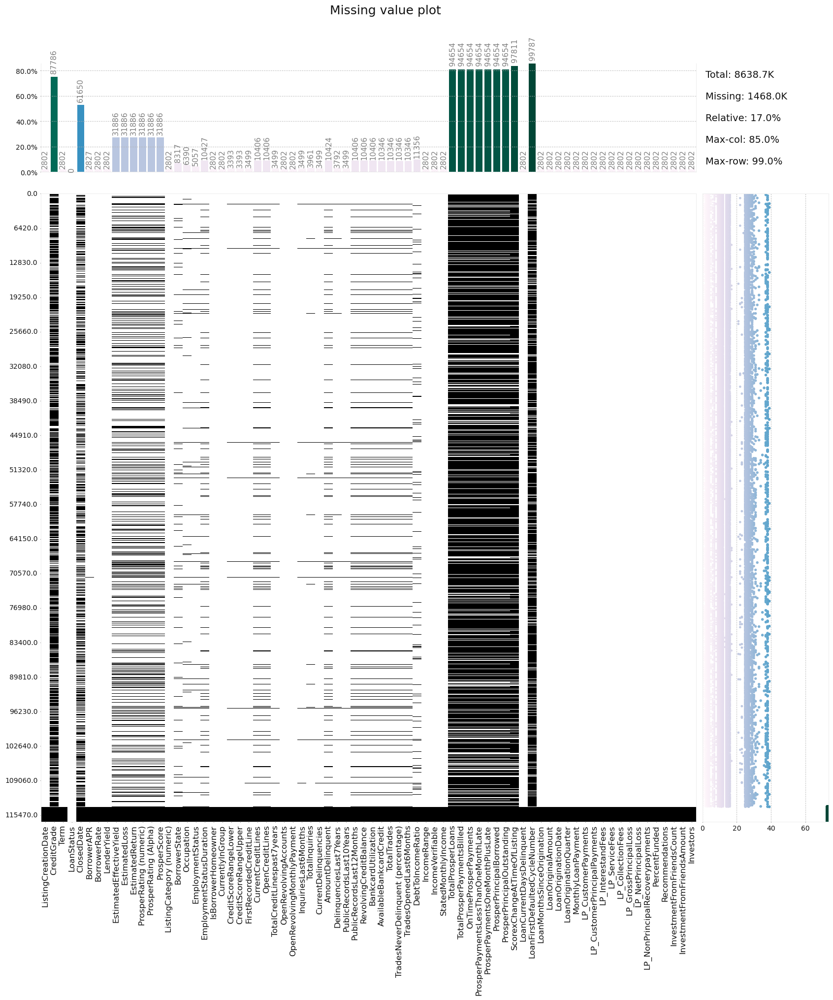

In [30]:
import klib
klib.missingval_plot(df)

In [31]:
num_cols = df.select_dtypes(include=['float64', 'int64']).columns
df[num_cols] = df[num_cols].fillna(df[num_cols].mean())

cat_cols = df.select_dtypes(include=['category','object']).columns
cat_cols= cat_cols.drop('LoanStatus')
df[cat_cols] = df[cat_cols].fillna(df[cat_cols].mode().iloc[0])

In [32]:
nulls=df.isnull().sum()
nulls

ListingCreationDate                    0
CreditGrade                            0
Term                                   0
LoanStatus                             0
ClosedDate                             0
BorrowerAPR                            0
BorrowerRate                           0
LenderYield                            0
EstimatedEffectiveYield                0
EstimatedLoss                          0
EstimatedReturn                        0
ProsperRating (numeric)                0
ProsperRating (Alpha)                  0
ProsperScore                           0
ListingCategory (numeric)              0
BorrowerState                          0
Occupation                             0
EmploymentStatus                       0
EmploymentStatusDuration               0
IsBorrowerHomeowner                    0
CurrentlyInGroup                       0
CreditScoreRangeLower                  0
CreditScoreRangeUpper                  0
FirstRecordedCreditLine                0
CurrentCreditLin

In [33]:
df['IncomeRange'].unique()

array(['$25,000-49,999', '$50,000-74,999', 'Not displayed', '$100,000+',
       '$75,000-99,999', '$1-24,999', 'Not employed', '$0'], dtype=object)

In [34]:
df['IncomeRange'] = df['IncomeRange'].replace(['Not displayed', 'Not employed'], ['$0','$0'])

Date Formatting

In [35]:
df['ListingCreationDate'] = pd.to_datetime(df['ListingCreationDate'])
df['FirstRecordedCreditLine'] = pd.to_datetime(df['FirstRecordedCreditLine'])
df['LoanOriginationDate'] = pd.to_datetime(df['LoanOriginationDate'])

# Data Visualisation of Categorical Variables

Text(0.5, 0, 'BorrowerState')

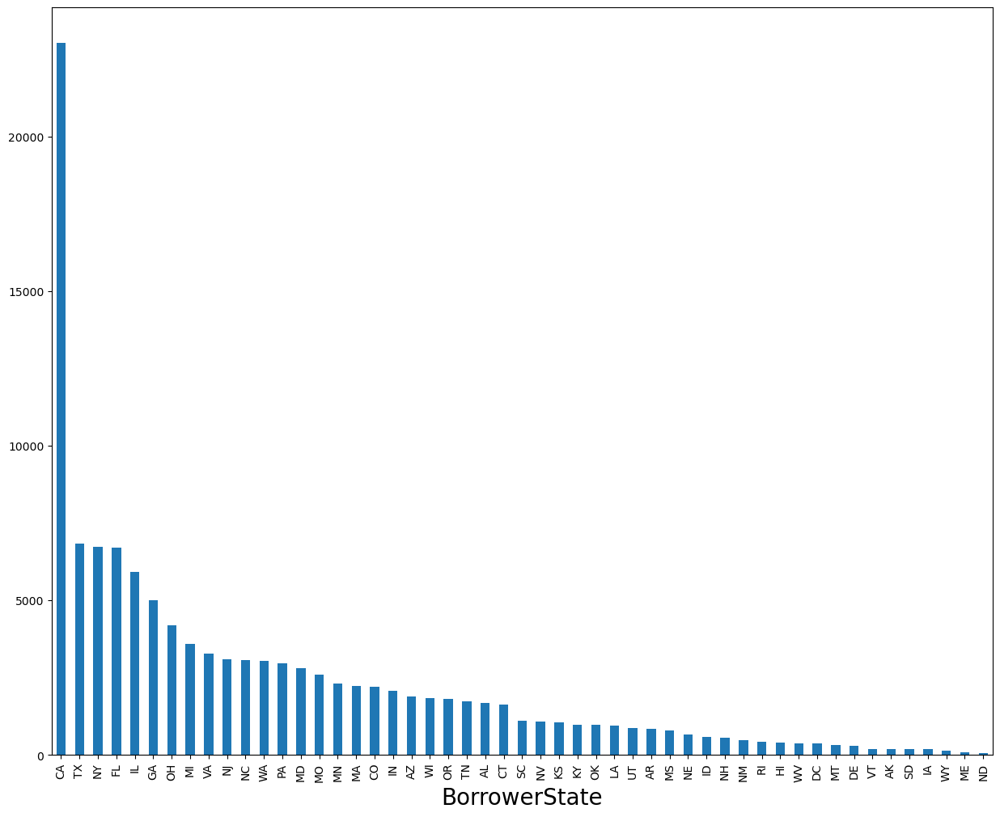

In [36]:
plt.figure(figsize=(15,12))
df['BorrowerState'].value_counts().plot.bar()
plt.xlabel('BorrowerState', fontsize=20)

Text(0.5, 0, 'Occupation')

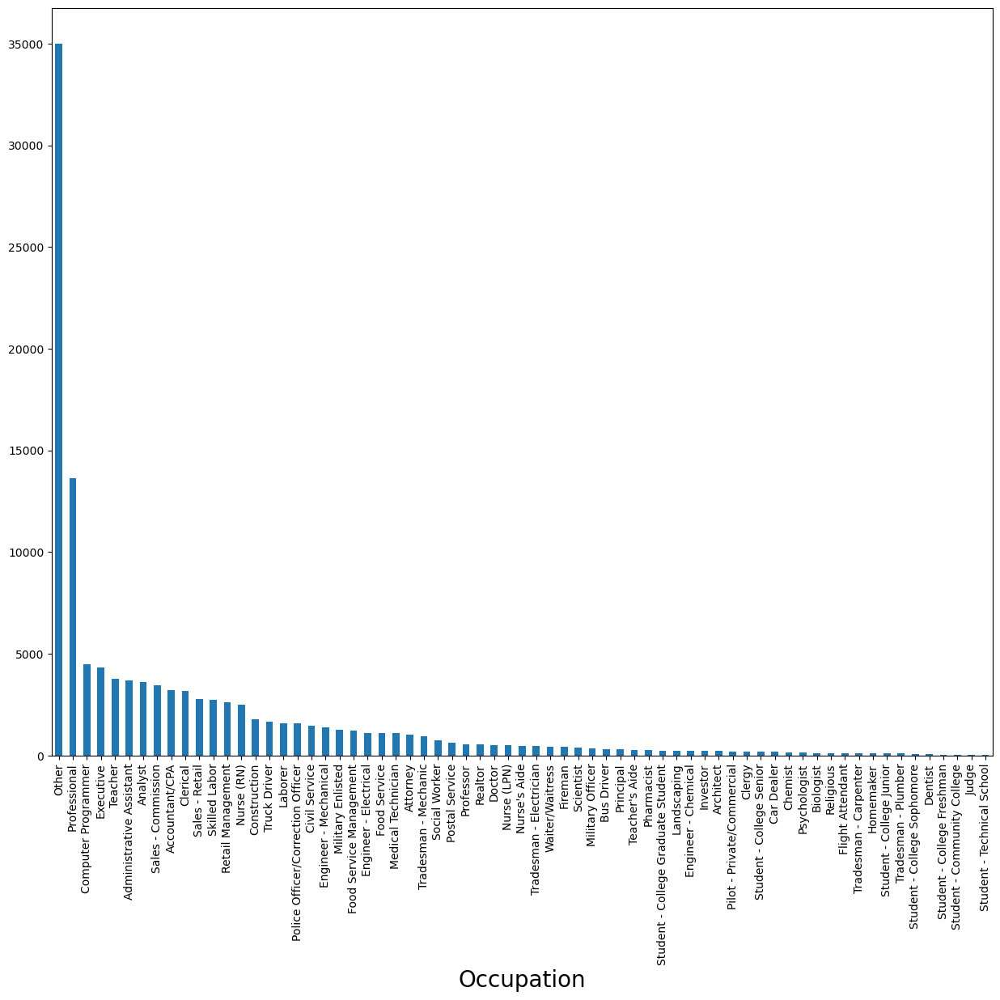

In [37]:
plt.figure(figsize=(15,12))
df['Occupation'].value_counts().plot.bar()
plt.xlabel('Occupation', fontsize=20)

Text(0.5, 0, 'EmploymentStatus')

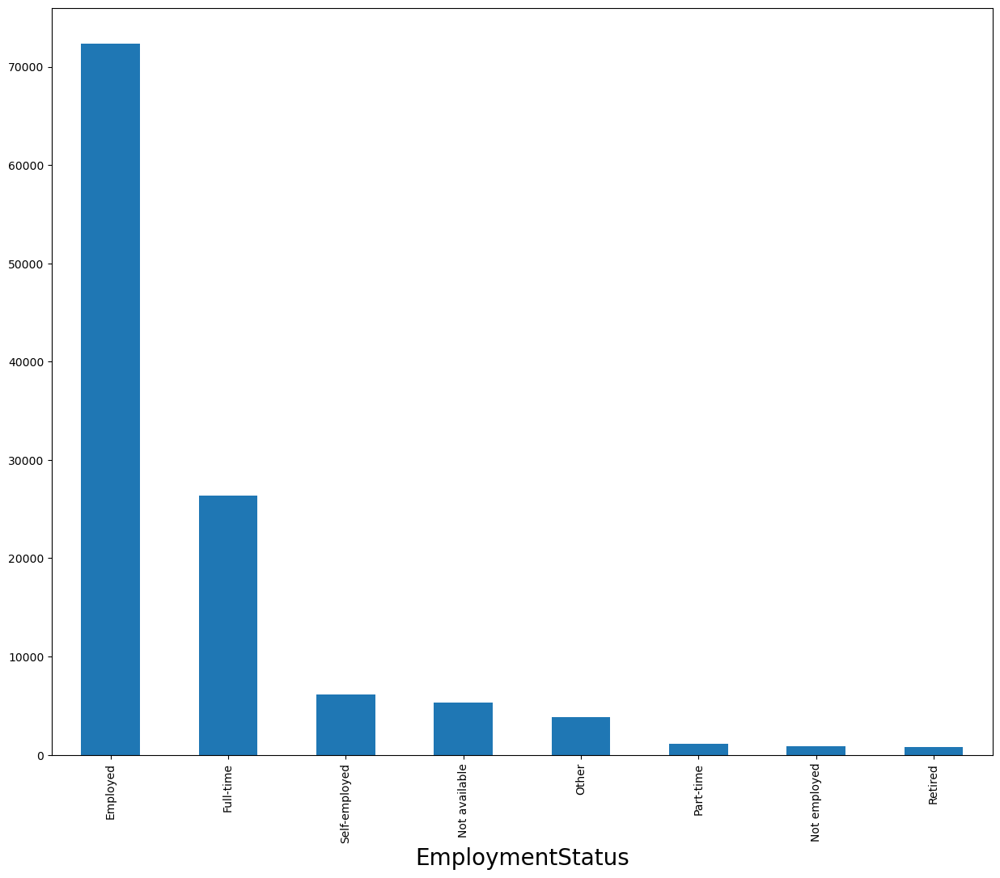

In [38]:
plt.figure(figsize=(15,12))
df['EmploymentStatus'].value_counts().plot.bar()
plt.xlabel('EmploymentStatus', fontsize=20)

Text(0.5, 0, 'IncomeRange')

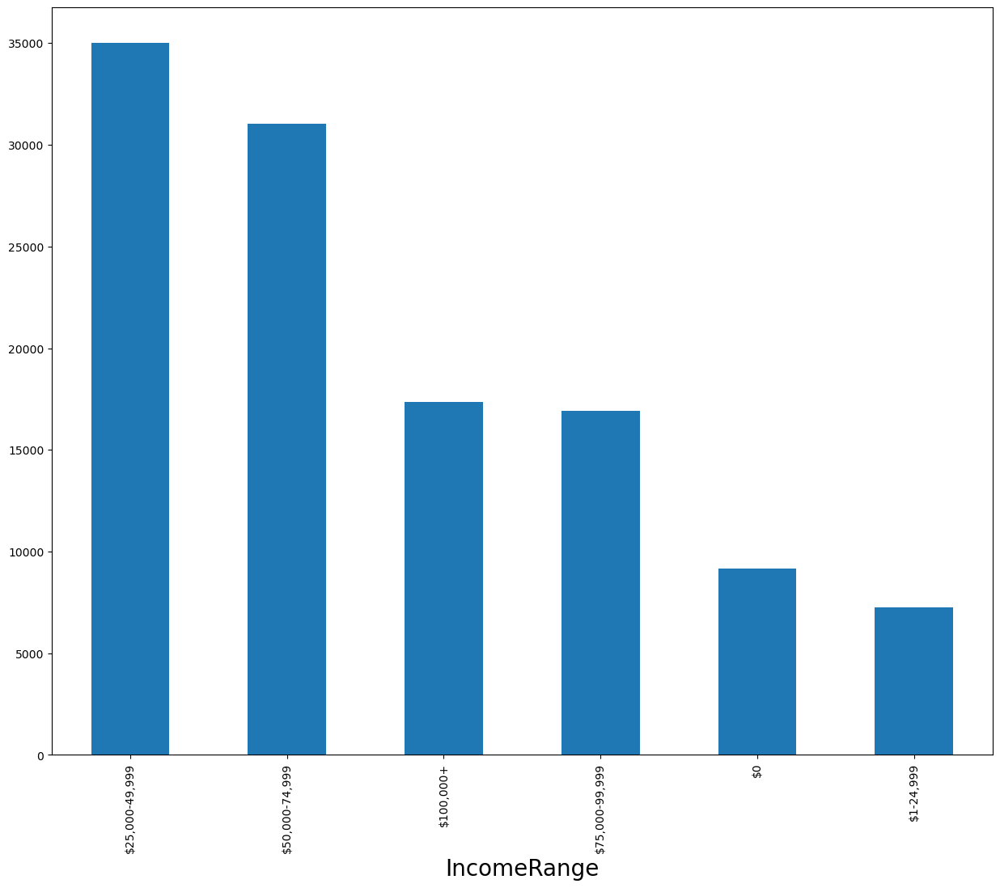

In [39]:
plt.figure(figsize=(15,12))
df['IncomeRange'].value_counts().plot.bar()
plt.xlabel('IncomeRange', fontsize=20)

Text(0.5, 0, 'EmploymentStatus')

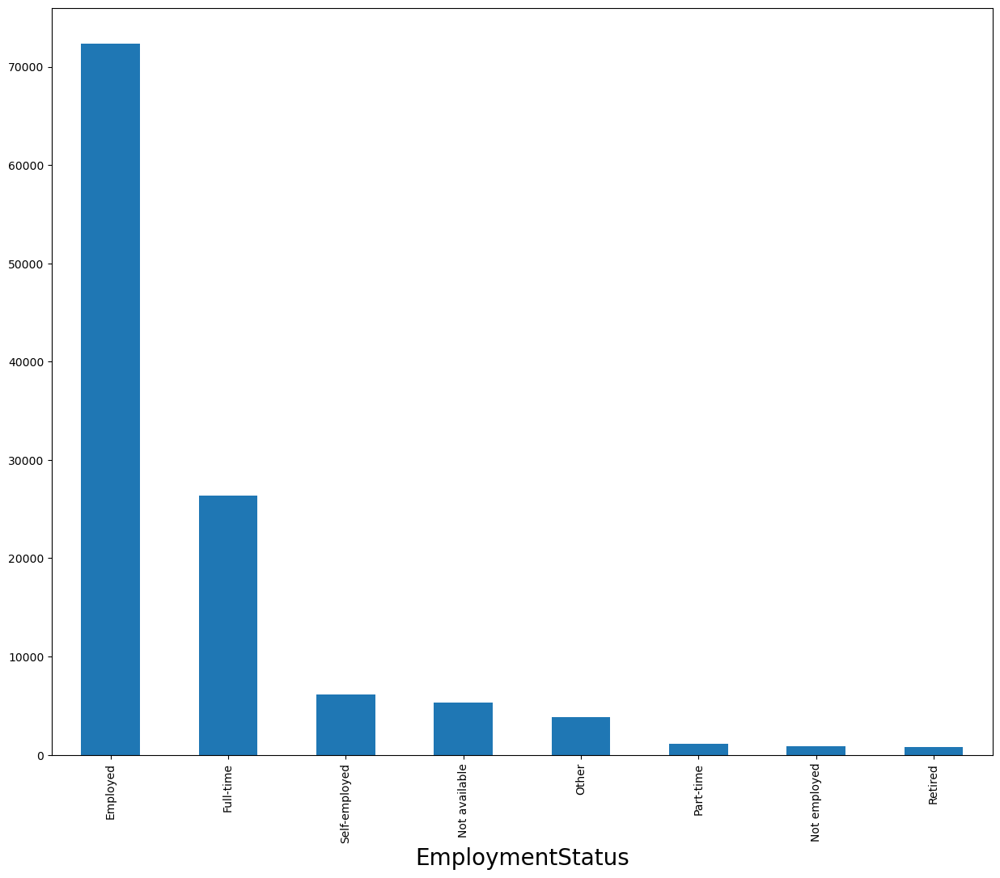

In [40]:
plt.figure(figsize=(15,12))
df['EmploymentStatus'].value_counts().plot.bar()
plt.xlabel('EmploymentStatus', fontsize=20)

C:\Users\arunk\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\arunk\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\arunk\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-lev

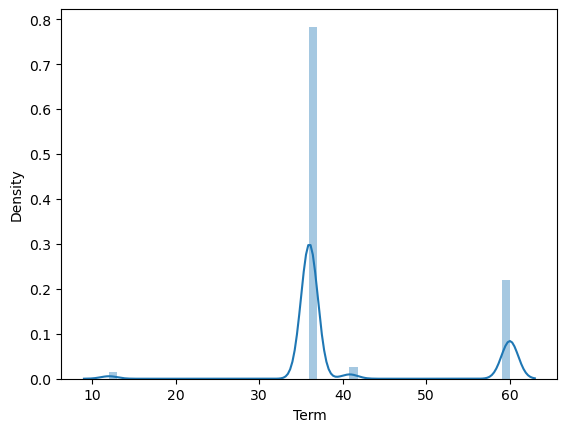

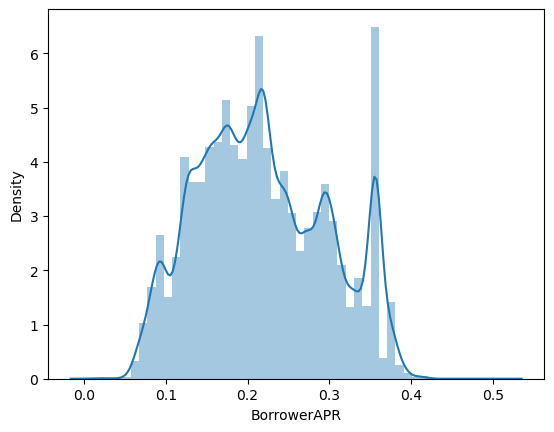

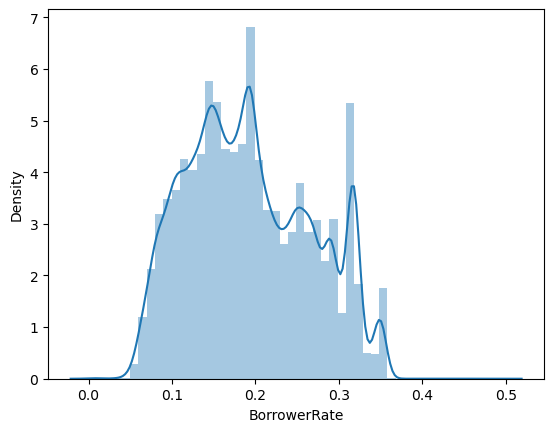

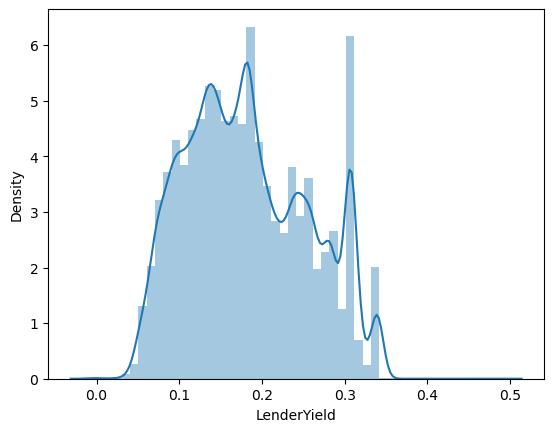

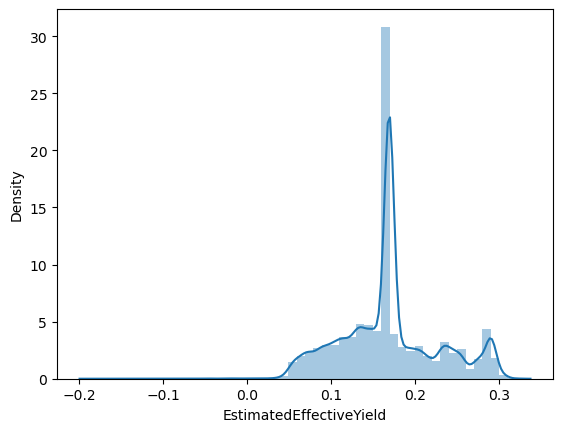

...

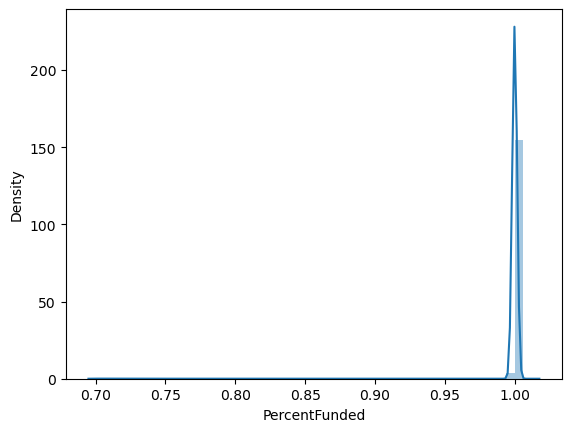

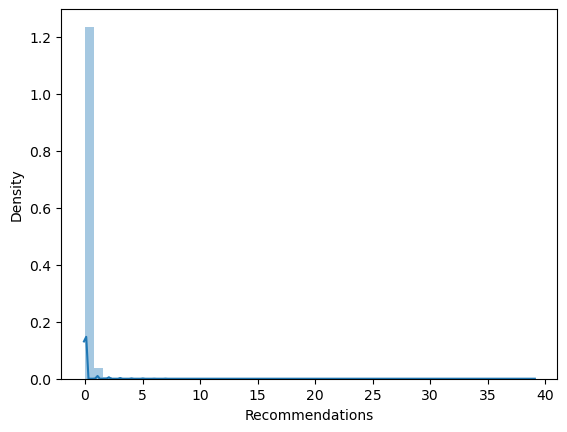

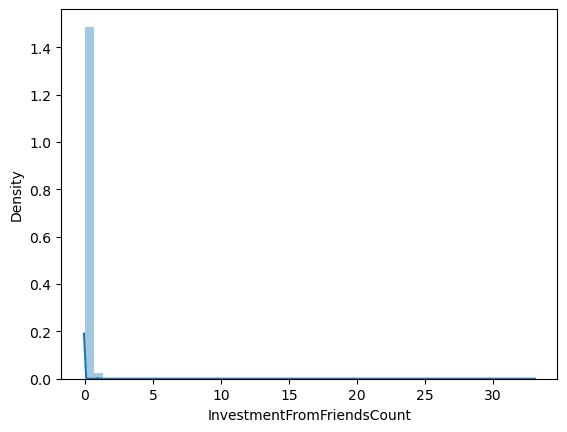

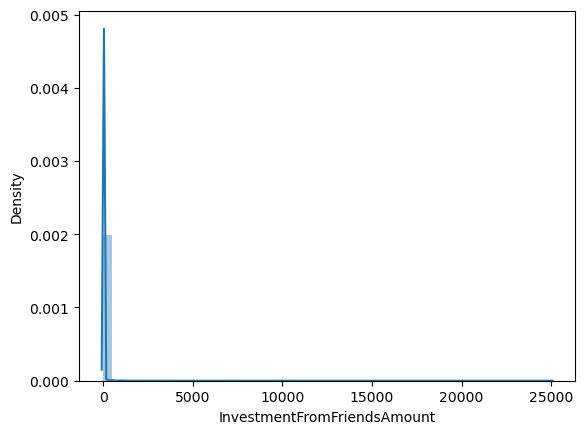

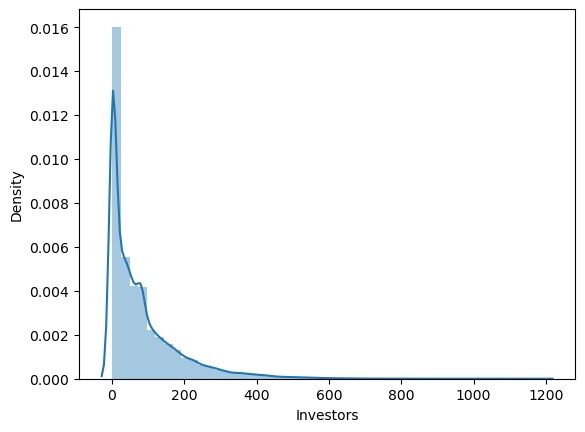

In [41]:
for i in num_cols:
    plt.figure()
    sns.distplot(df[i])

# Handling Outliers

In [42]:
num_cols

Index(['Term', 'BorrowerAPR', 'BorrowerRate', 'LenderYield',
       'EstimatedEffectiveYield', 'EstimatedLoss', 'EstimatedReturn',
       'ProsperRating (numeric)', 'ProsperScore', 'ListingCategory (numeric)',
       'EmploymentStatusDuration', 'CreditScoreRangeLower',
       'CreditScoreRangeUpper', 'CurrentCreditLines', 'OpenCreditLines',
       'TotalCreditLinespast7years', 'OpenRevolvingAccounts',
       'OpenRevolvingMonthlyPayment', 'InquiriesLast6Months', 'TotalInquiries',
       'CurrentDelinquencies', 'AmountDelinquent', 'DelinquenciesLast7Years',
       'PublicRecordsLast10Years', 'PublicRecordsLast12Months',
       'RevolvingCreditBalance', 'BankcardUtilization',
       'AvailableBankcardCredit', 'TotalTrades',
       'TradesNeverDelinquent (percentage)', 'TradesOpenedLast6Months',
       'DebtToIncomeRatio', 'StatedMonthlyIncome', 'TotalProsperLoans',
       'TotalProsperPaymentsBilled', 'OnTimeProsperPayments',
       'ProsperPaymentsLessThanOneMonthLate',
       'ProsperP

C:\Users\arunk\AppData\Local\Temp\ipykernel_2076\869562444.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


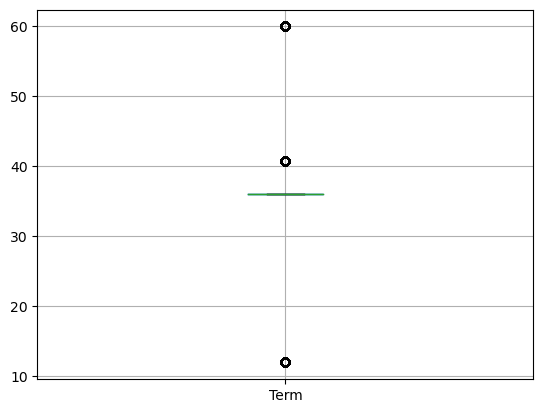

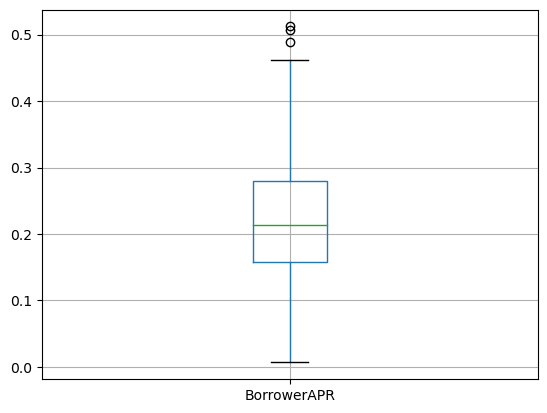

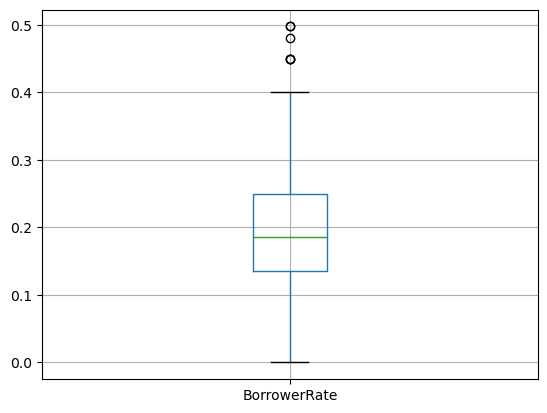

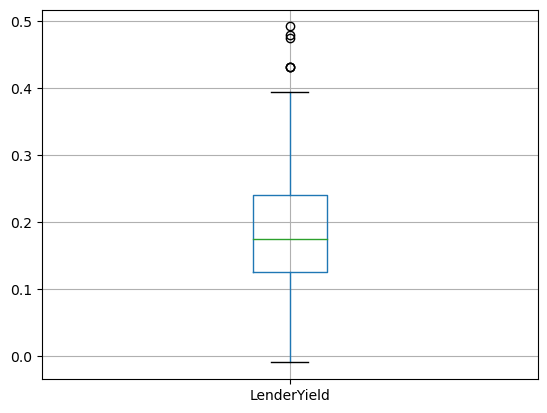

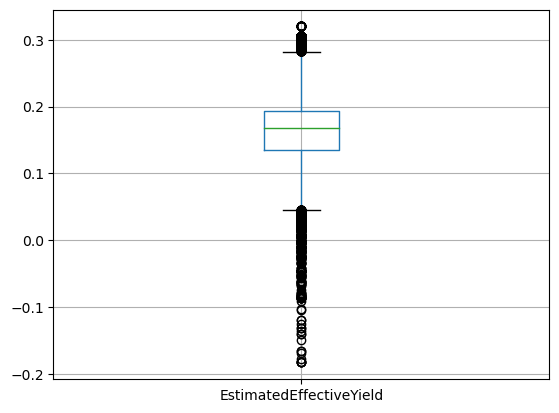

...

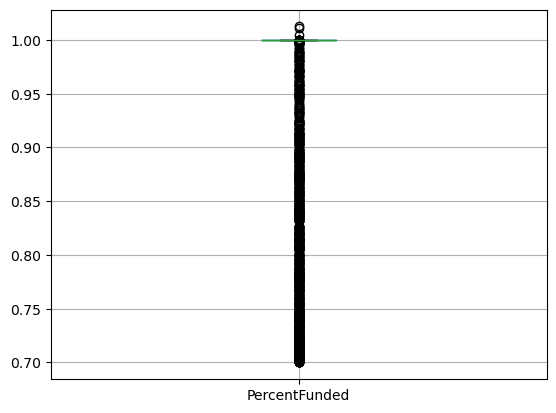

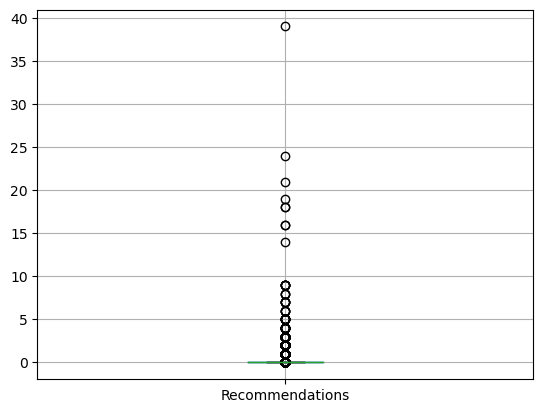

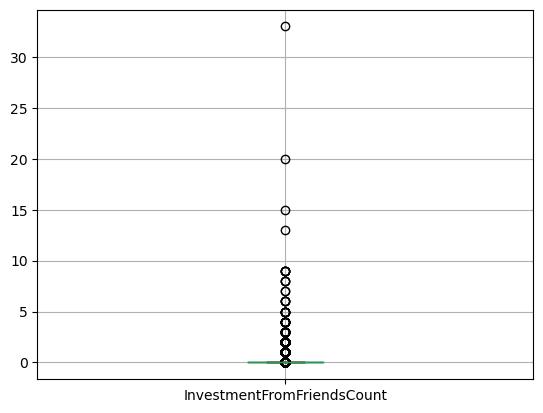

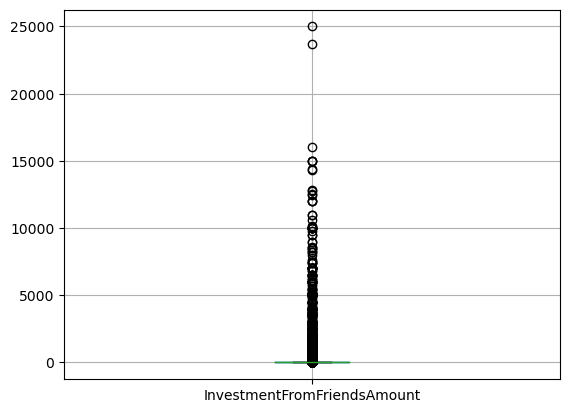

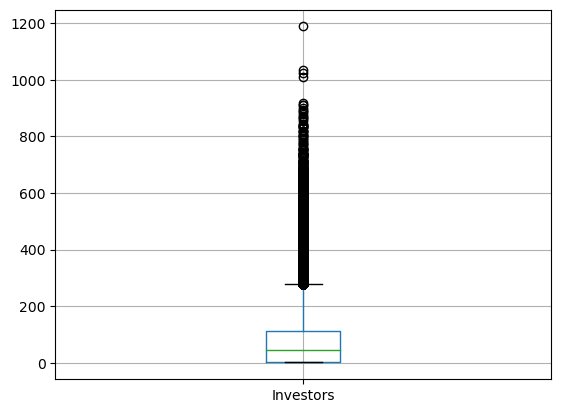

In [43]:
for i in num_cols:
    plt.figure()
    df.boxplot(column=i)
    plt.show

In [44]:
for i in num_cols :
    Q3 = df[i].quantile(.75)
    Q1 = df[i].quantile(.25)
    IQR = Q3 - Q1 
    upper_whisker = Q3 + 1.5 * IQR
    lower_whisker = Q1 - 1.5 * IQR
    filt2 = df[i] >  upper_whisker 
    filt3 = df[i] <  lower_whisker
    out2 = df[filt2].index
    out3 = df[filt3].index
    df= df.drop(out3 , axis = 0)

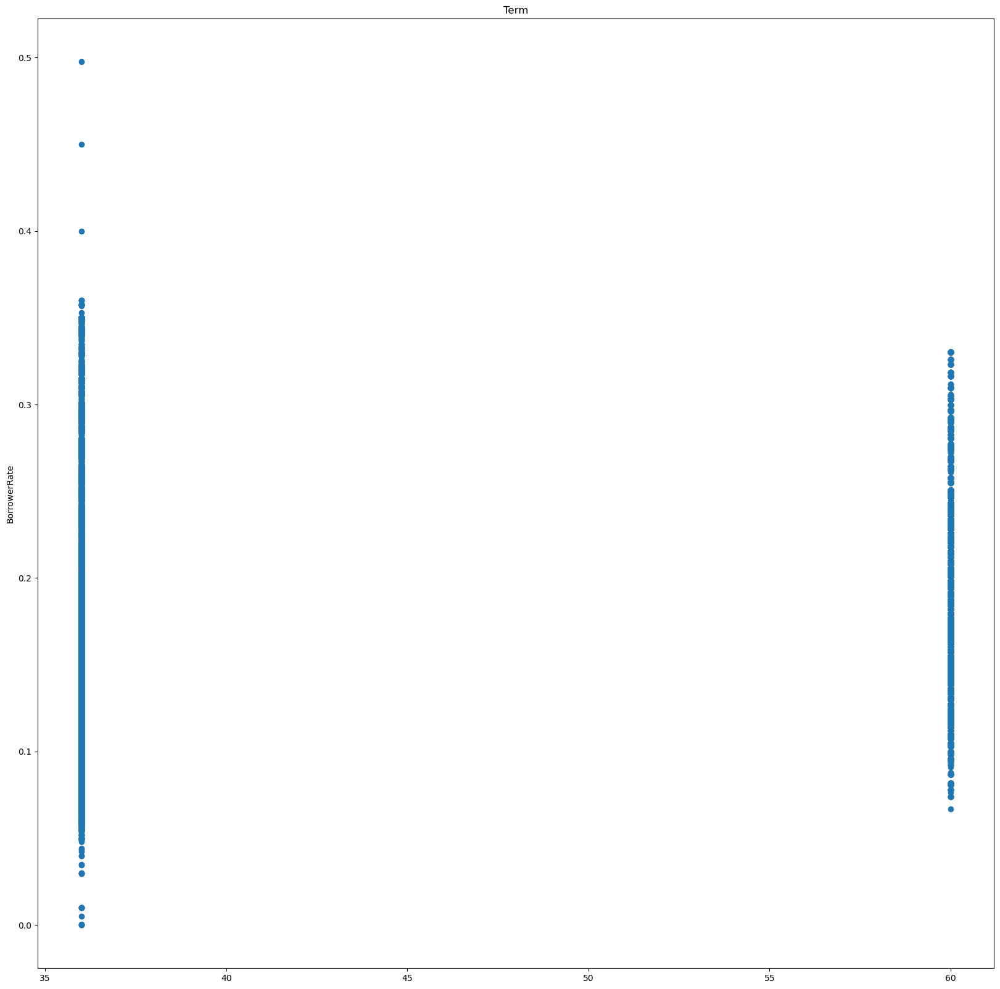

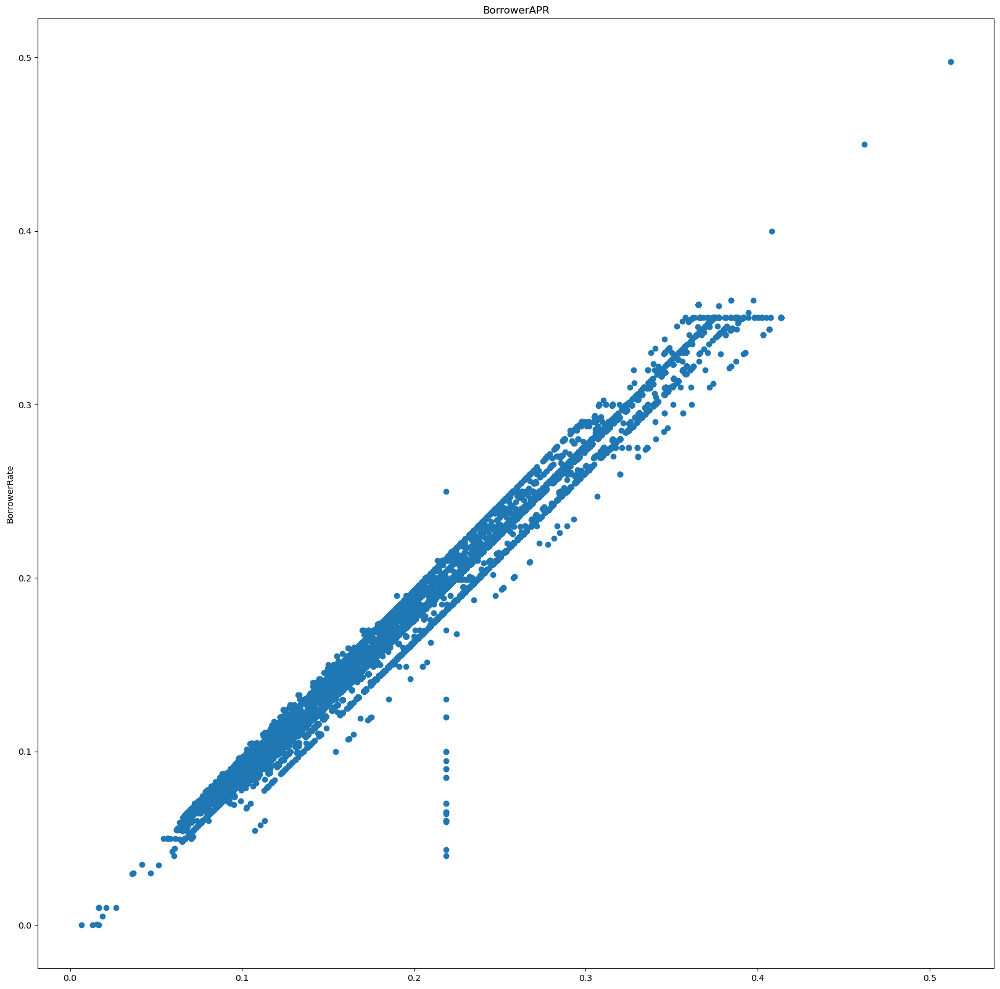

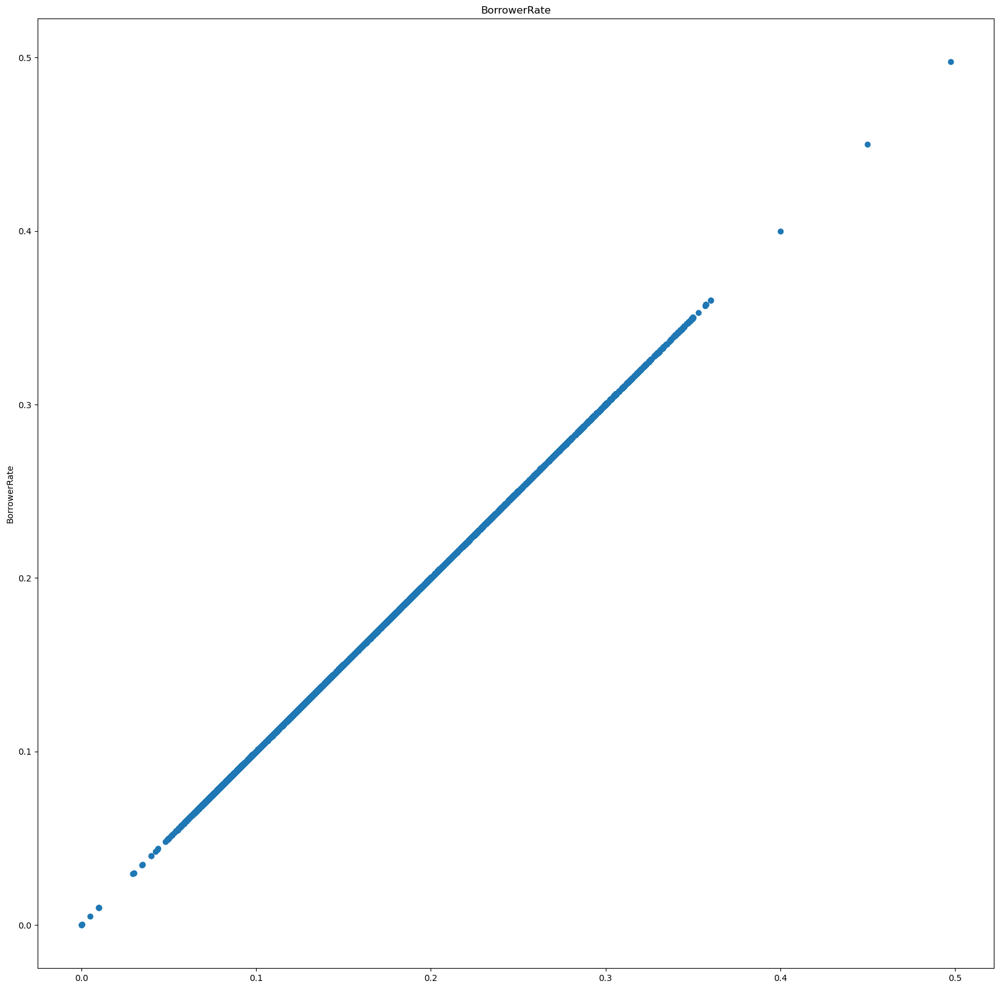

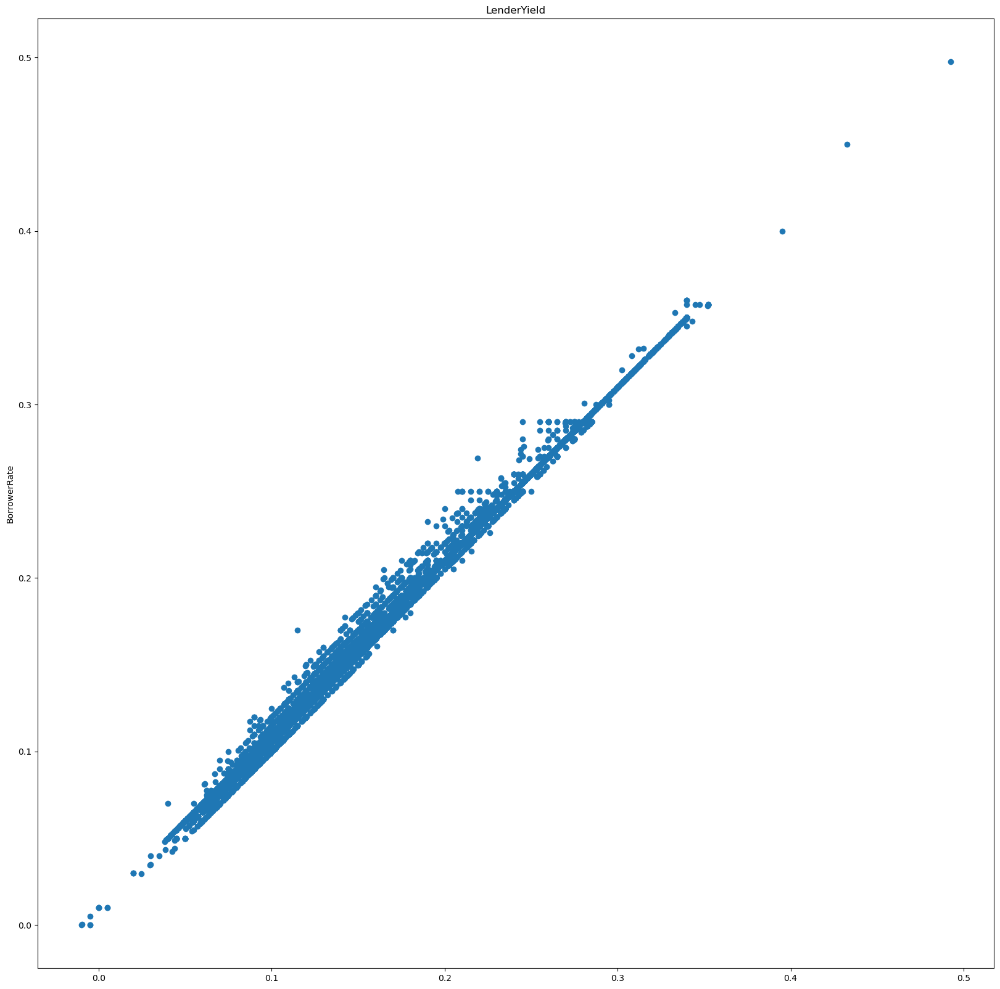

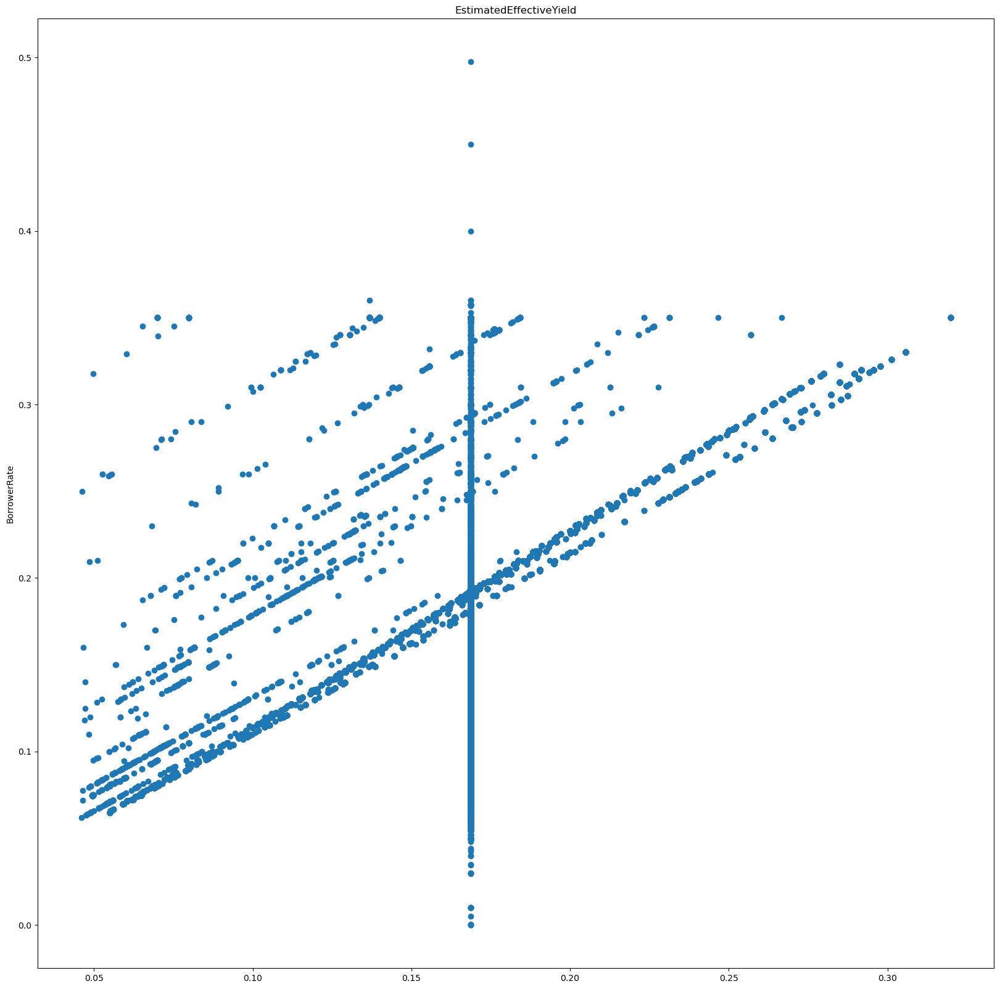

...

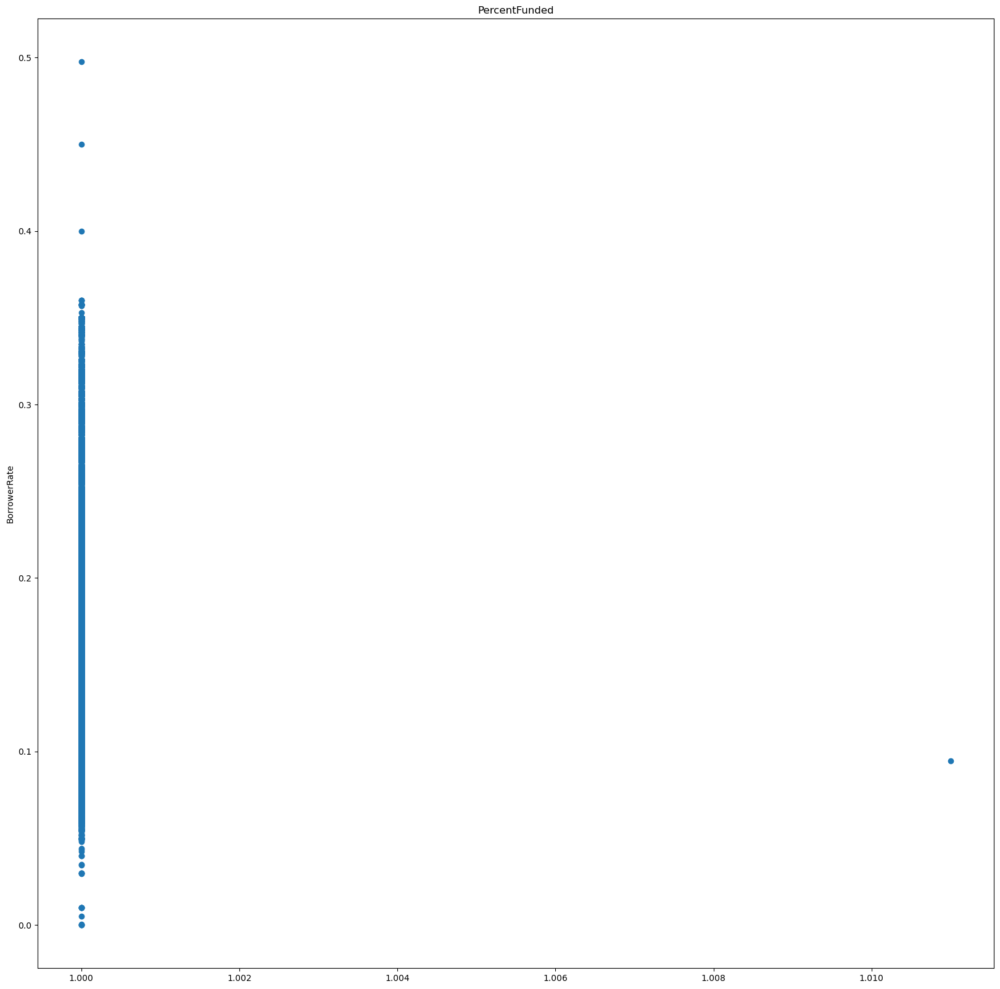

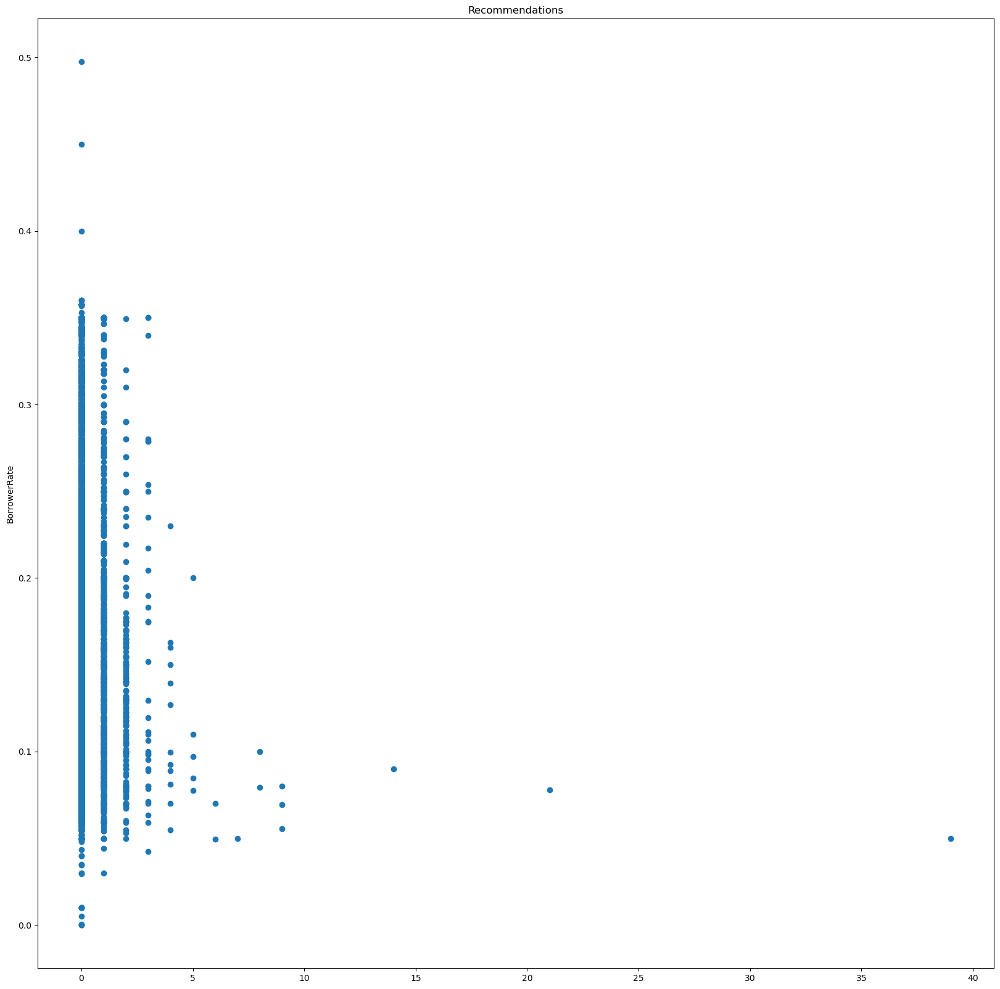

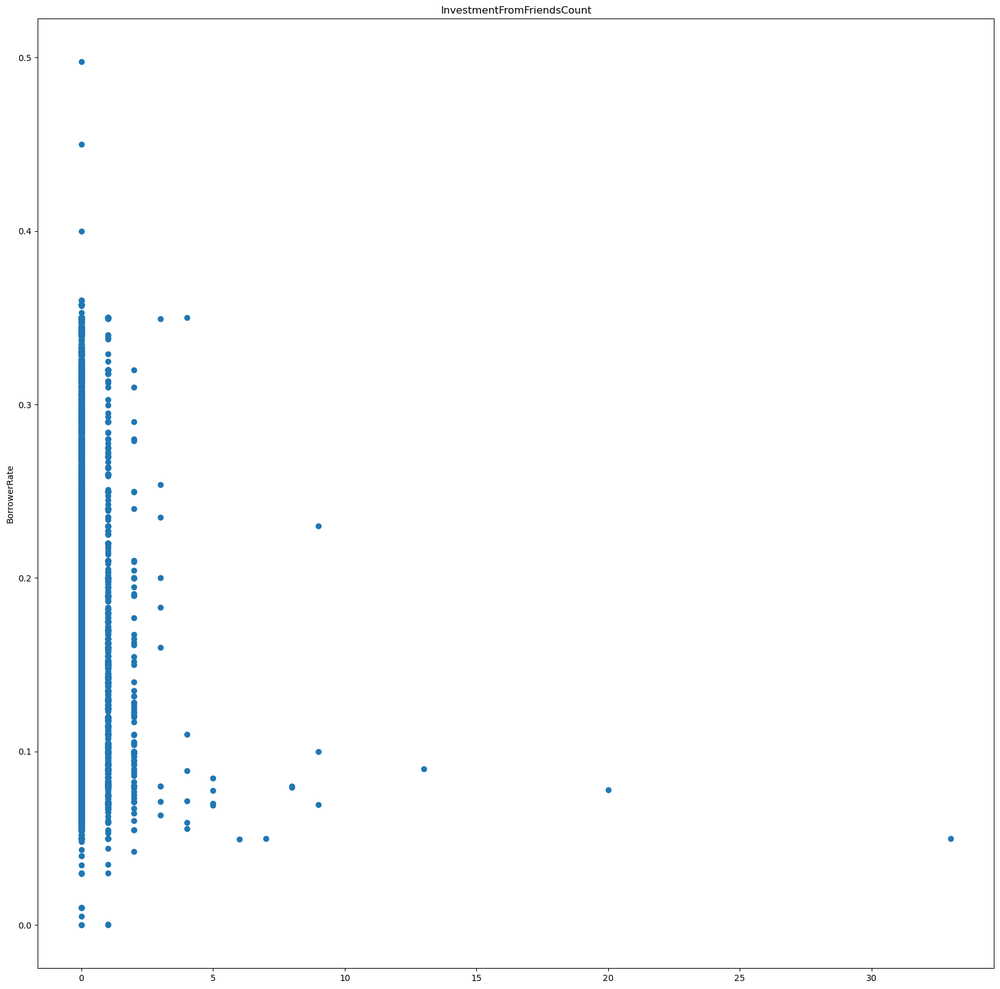

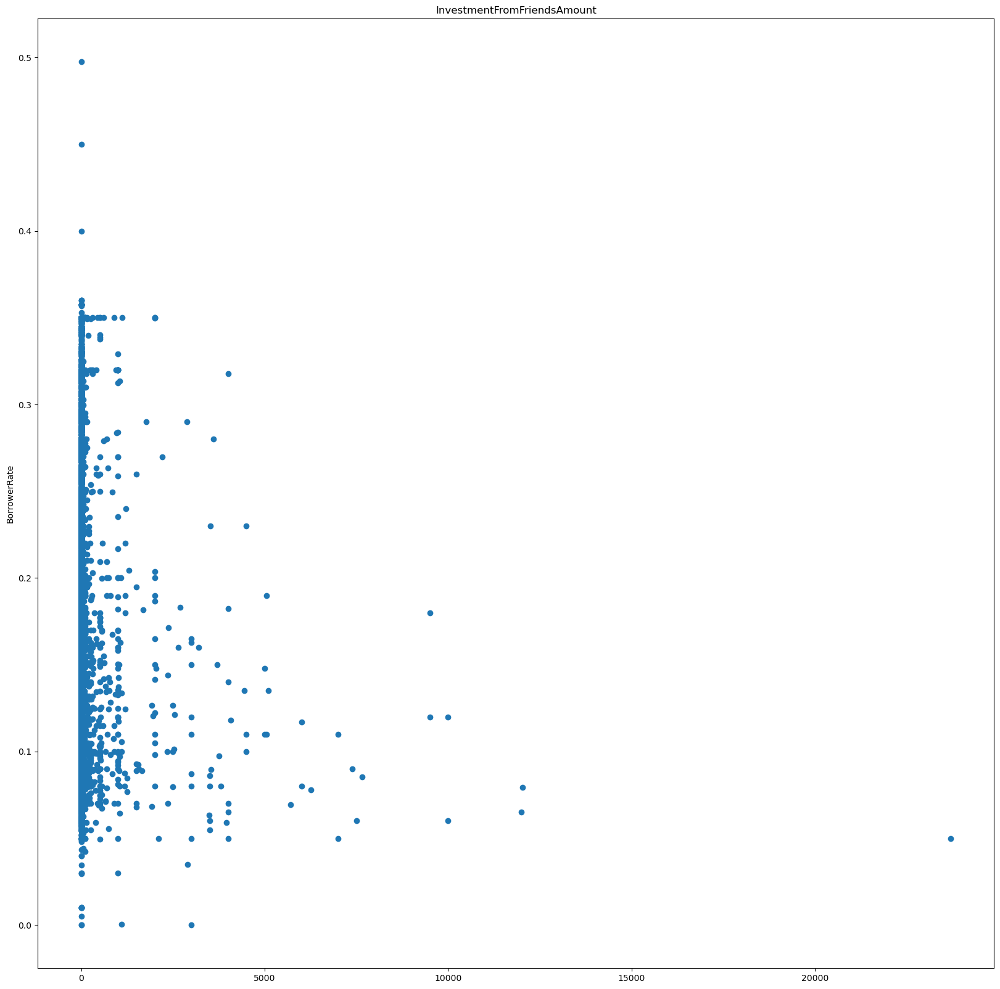

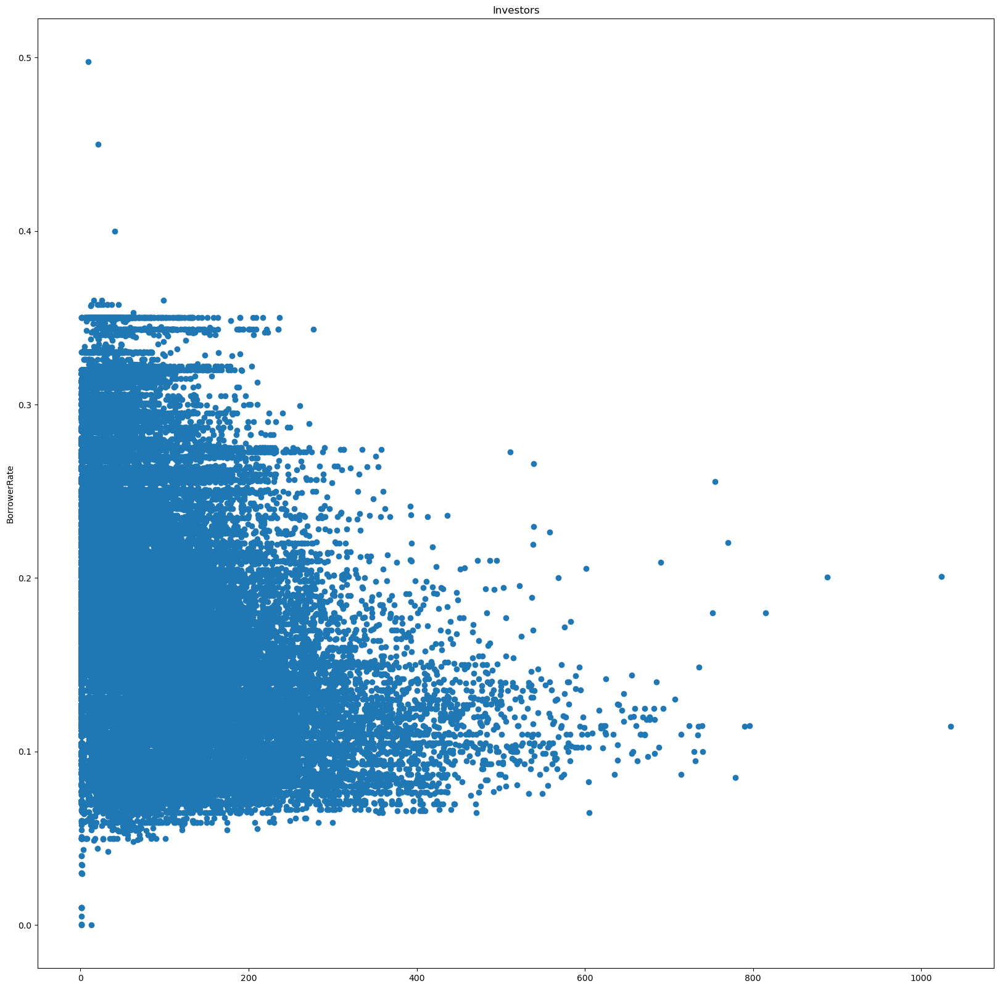

In [45]:
num = df.select_dtypes('number').columns.to_list()
#numeric df
BM_num =  df[num]
for numeric in BM_num:
    plt.figure(figsize=(20,20))
    plt.scatter(BM_num[numeric], BM_num['BorrowerRate'])
    plt.title(numeric)
    plt.ylabel('BorrowerRate')
    plt.show()

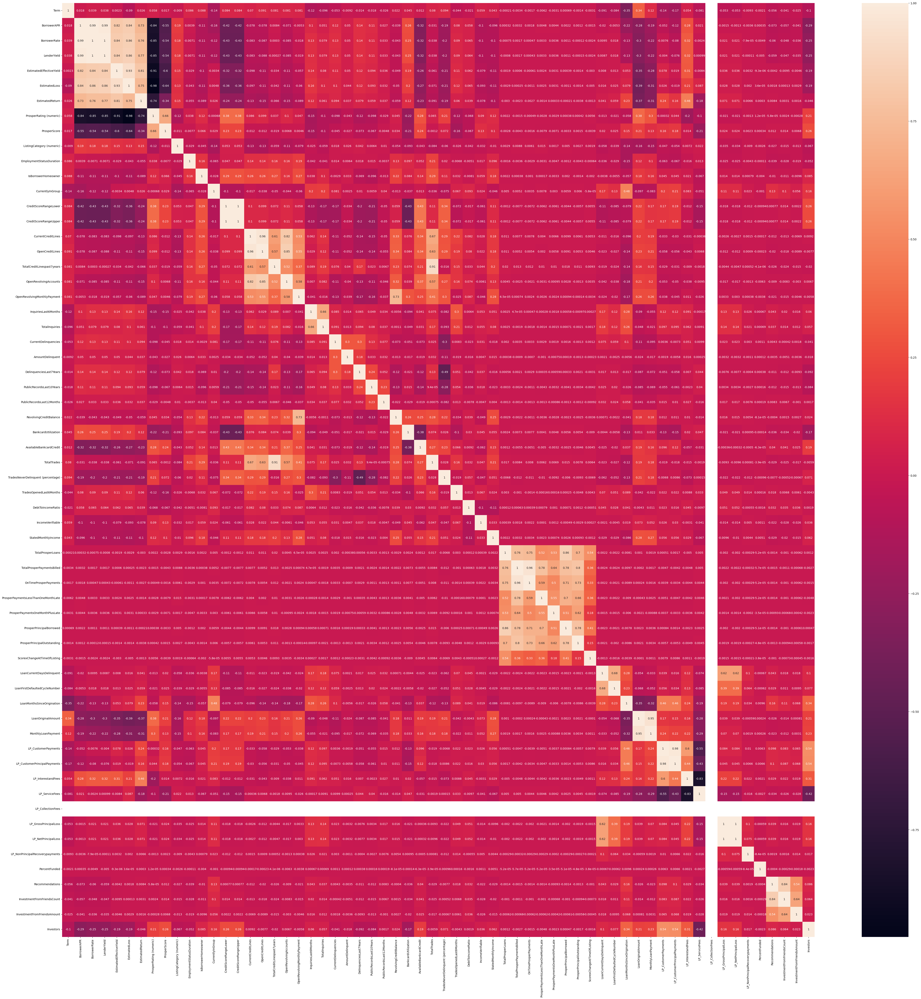

In [46]:
plt.figure(figsize=(60,60)) 
sns.heatmap(df.corr(),annot = True)
plt.show()

# Answering some research questions

Text(0.5, 0, 'CreditGrade')

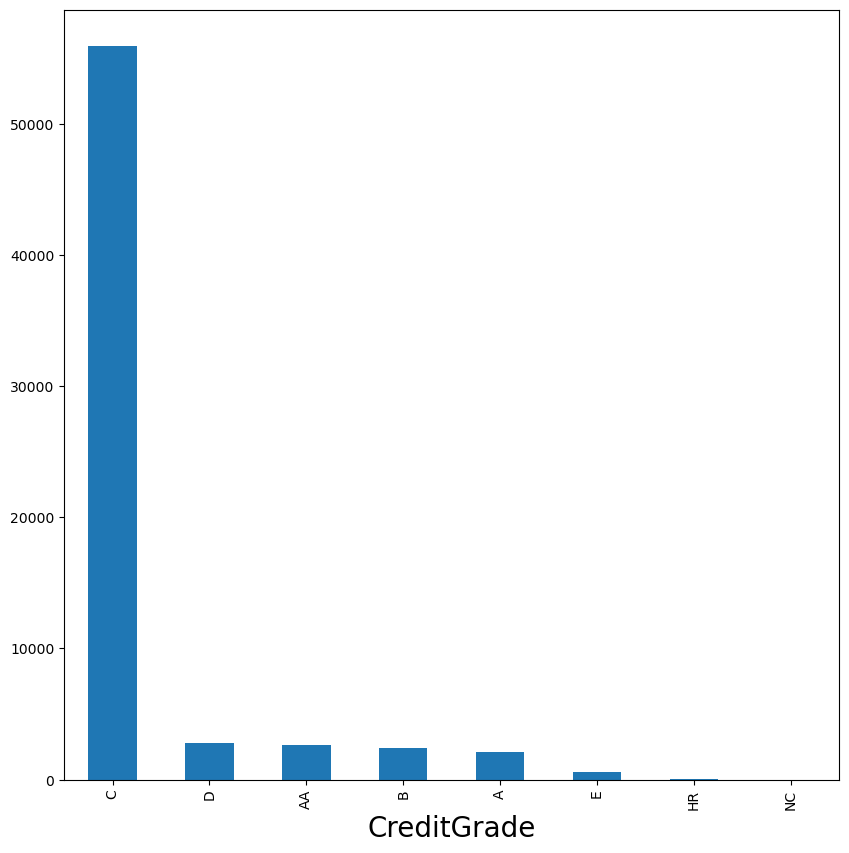

In [47]:
plt.figure(figsize=(10,10))
df['CreditGrade'].value_counts().plot.bar()
plt.xlabel('CreditGrade', fontsize=20)

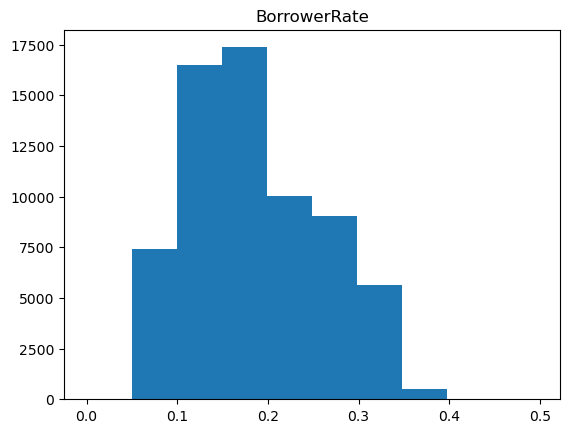

In [48]:
plt.hist(df['BorrowerRate'])
plt.title("BorrowerRate")
plt.show()

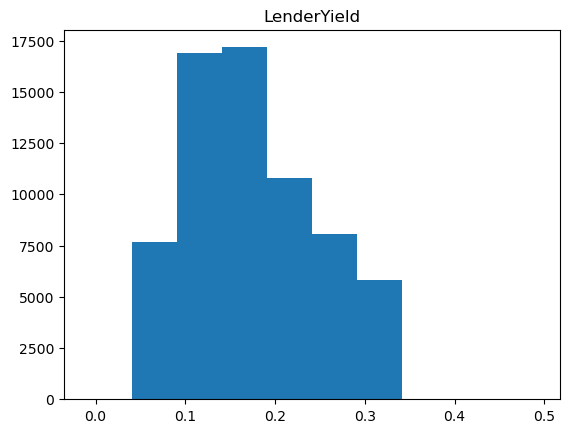

In [49]:
plt.hist(df['LenderYield'])
plt.title("LenderYield")
plt.show()

<AxesSubplot:xlabel='CreditGrade', ylabel='MonthlyLoanPayment'>

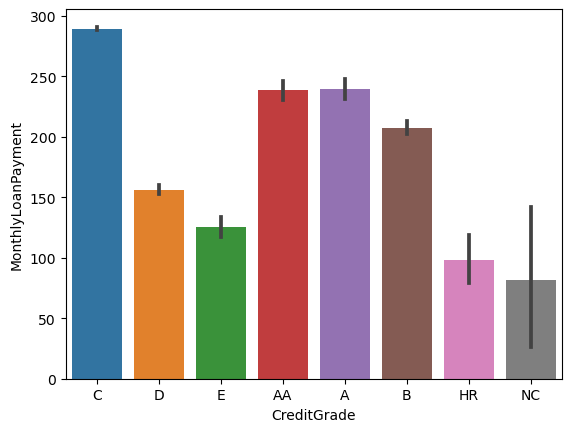

In [50]:
sns.barplot(x='CreditGrade', y='MonthlyLoanPayment', data=df)

# Label Encoding

In [51]:
le = LabelEncoder()
cols = [ 'ProsperRating (Alpha)' ,'EmploymentStatus' , 
       'BorrowerState','Occupation' ,  'LoanOriginationQuarter' , 'LoanStatus' , 'IncomeRange']
for i in cols:
    df[i] = le.fit_transform(df[i] )

In [52]:
import warnings# warning filter
warnings.filterwarnings("ignore")

In [53]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 66493 entries, 0 to 113936
Data columns (total 74 columns):
 #   Column                               Non-Null Count  Dtype         
---  ------                               --------------  -----         
 0   ListingCreationDate                  66493 non-null  datetime64[ns]
 1   CreditGrade                          66493 non-null  object        
 2   Term                                 66493 non-null  float64       
 3   LoanStatus                           66493 non-null  int32         
 4   ClosedDate                           66493 non-null  object        
 5   BorrowerAPR                          66493 non-null  float64       
 6   BorrowerRate                         66493 non-null  float64       
 7   LenderYield                          66493 non-null  float64       
 8   EstimatedEffectiveYield              66493 non-null  float64       
 9   EstimatedLoss                        66493 non-null  float64       
 10  EstimatedRetur

# Hot Encoding

In [54]:
lis = ['IsBorrowerHomeowner' , 'CurrentlyInGroup' ,'IncomeVerifiable' ]
for i in lis :
    df[i][df[i] == True] = 1
    df[i][df[i] == False] = 0

In [55]:
df.head()

,ListingCreationDate,CreditGrade,Term,LoanStatus,ClosedDate,BorrowerAPR,BorrowerRate,LenderYield,EstimatedEffectiveYield,EstimatedLoss,EstimatedReturn,ProsperRating (numeric),ProsperRating (Alpha),ProsperScore,ListingCategory (numeric),BorrowerState,Occupation,EmploymentStatus,EmploymentStatusDuration,IsBorrowerHomeowner,CurrentlyInGroup,CreditScoreRangeLower,CreditScoreRangeUpper,FirstRecordedCreditLine,CurrentCreditLines,OpenCreditLines,TotalCreditLinespast7years,OpenRevolvingAccounts,OpenRevolvingMonthlyPayment,InquiriesLast6Months,TotalInquiries,CurrentDelinquencies,AmountDelinquent,DelinquenciesLast7Years,PublicRecordsLast10Years,PublicRecordsLast12Months,RevolvingCreditBalance,BankcardUtilization,AvailableBankcardCredit,TotalTrades,TradesNeverDelinquent (percentage),TradesOpenedLast6Months,DebtToIncomeRatio,IncomeRange,IncomeVerifiable,StatedMonthlyIncome,TotalProsperLoans,TotalProsperPaymentsBilled,OnTimeProsperPayments,ProsperPaymentsLessThanOneMonthLate,ProsperPaymentsOneMonthPlusLate,ProsperPrincipalBorrowed,ProsperPrincipalOutstanding,ScorexChangeAtTimeOfListing,LoanCurrentDaysDelinquent,LoanFirstDefaultedCycleNumber,LoanMonthsSinceOrigination,LoanOriginalAmount,LoanOriginationDate,LoanOriginationQuarter,MonthlyLoanPayment,LP_CustomerPayments,LP_CustomerPrincipalPayments,LP_InterestandFees,LP_ServiceFees,LP_CollectionFees,LP_GrossPrincipalLoss,LP_NetPrincipalLoss,LP_NonPrincipalRecoverypayments,PercentFunded,Recommendations,InvestmentFromFriendsCount,InvestmentFromFriendsAmount,Investors
0,2007-08-26 19:09:29.263,C,36.0,1,2009-08-14 00:00:00,0.16516,0.1580,0.1380,0.168661,0.080306,0.096068,4.072243,3,5.950067,0.0,5,35,7,2.0,1,1,640.0,659.0,2001-10-11,5.0,4.0,12.0,1.0,24.0,3.0,3.0,2.0,472.0,4.0,0.0,0.0,0.0,0.00,1500.0,11.0,0.81,0.0,0.17,3,1,3083.333333,1.4211,22.934345,22.271949,0.613629,0.04854,8472.311961,2930.313906,-3.223214,0.0,16.268464,78.0,9425.0,2007-09-12,17,330.43,11396.14,9425.00,1971.14,-133.18,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,258.0
1,2014-02-27 08:28:07.900,C,36.0,1,2014-03-04 00:00:00,0.12016,0.0920,0.0820,0.079600,0.024900,0.054700,6.000000,0,7.000000,2.0,5,41,0,44.0,0,0,680.0,699.0,1996-03-18,14.0,14.0,29.0,13.0,389.0,3.0,5.0,0.0,0.0,0.0,1.0,0.0,3989.0,0.21,10266.0,29.0,1.00,2.0,0.18,4,1,6125.000000,1.4211,22.934345,22.271949,0.613629,0.04854,8472.311961,2930.313906,-3.223214,0.0,16.268464,0.0,10000.0,2014-03-03,7,318.93,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,2012-10-22 11:02:35.010,C,36.0,1,2014-03-04 00:00:00,0.12528,0.0974,0.0874,0.084900,0.024900,0.060000,6.000000,0,9.000000,16.0,10,50,0,113.0,1,0,800.0,819.0,1983-02-28,5.0,5.0,29.0,7.0,115.0,0.0,1.0,4.0,10056.0,14.0,0.0,0.0,1444.0,0.04,30754.0,26.0,0.76,0.0,0.15,3,1,2875.000000,1.4211,22.934345,22.271949,0.613629,0.04854,8472.311961,2930.313906,-3.223214,0.0,16.268464,16.0,10000.0,2012-11-01,31,321.45,5143.20,4091.09,1052.11,-108.01,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,158.0
5,2013-12-14 08:26:37.093,C,60.0,1,2014-03-04 00:00:00,0.15425,0.1314,0.1214,0.115670,0.044900,0.070770,5.000000,2,10.000000,1.0,32,41,0,82.0,1,0,740.0,759.0,1973-03-01,21.0,17.0,49.0,13.0,1410.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,62999.0,0.39,86509.0,47.0,1.00,0.0,0.36,2,1,8333.333333,1.4211,22.934345,22.271949,0.613629,0.04854,8472.311961,2930.313906,-3.223214,0.0,16.268464,3.0,15000.0,2013-12-24,32,342.37,679.34,351.89,327.45,-25.33,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
6,2013-04-12 09:52:56.147,C,36.0,1,2014-03-04 00:00:00,0.31032,0.2712,0.2612,0.238200,0.127500,0.110700,2.000000,5,2.000000,1.0,16,48,0,172.0,0,0,680.0,699.0,2000-09-29,10.0,7.0,20.0,6.0,214.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5812.0,0.72,1929.0,16.0,0.68,0.0,0.27,3,1,2083.333333,1.4211,22.934345,22.271949,0.613629,0.04854,8472.311961,2930.313906,-3.223214,0.0,16.268464,11.0,3000.0,2013-04-18,15,122.67,1226.70,604.25,622.45,-22.95,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0


In [56]:
df.shape

(66493, 74)